# Notebook 23 — Entraînement final Mask2Former sur le GT CoolPath 360° (116 frames)

**Objectif :** entraînement final de Mask2Former-SwinB sur les 116 frames équirectangulaires annotées dans CVAT, en partant du checkpoint **fine-tuné du notebook 18** (et non du modèle Cityscapes de base).

**Pipeline :**
1. Conversion masks CVAT RGB → indices Cityscapes 0..18 (background → 255 ignore) + statistiques de classes
2. Split train/val **stratifié par vidéo** (pas de fuite entre vidéos)
3. Sanity check visuel du dataset
4. Config d'entraînement optimisée 16 Go VRAM (voir tableau des hyperparamètres, section 5)
5. Entraînement avec **reprise automatique** (`--resume`) : on peut interrompre et relancer la cellule
6. Courbes d'entraînement (loss, mIoU val)
7. Évaluation finale : mIoU / aAcc / mAcc, IoU par classe, matrice de confusion, **TTA multi-échelle + flip**
8. Comparaison quantitative **nb18 vs nb23** sur le même val set
9. Visualisation image | GT | prédiction | carte d'erreurs
10. Analyse automatique (classes fortes/faibles, confusions dominantes, recommandations)

**Techniques utilisées pour maximiser mIoU / accuracy :**

| Technique | Effet attendu |
|---|---|
| Reprise depuis le checkpoint nb18 (déjà adapté au domaine) | convergence plus rapide, meilleur point de départ |
| Gel des 2 premiers stages Swin (`frozen_stages=2`) | moins d'overfitting avec ~92 images train |
| Batch effectif 8 (batch 2 × `accumulative_counts=4`) | gradients plus stables sans dépasser 16 Go |
| AMP (`--amp`) | ÷2 mémoire → crop 512×1024 possible |
| Warmup linéaire 200 iters + PolyLR | stabilité en début d'entraînement |
| Augmentations : RandomResize 0.5–1.5, crop `cat_max_ratio`, flip, PhotoMetricDistortion | robustesse, anti-overfitting |
| `save_best="mIoU"` + `save_last` | meilleur modèle conservé + reprise possible |
| TTA (échelles 0.75/1.0/1.25 + flip horizontal) à l'évaluation | +0.5 à +1.5 pt mIoU typiquement |

> Note : le flip horizontal est géométriquement valide sur une image équirectangulaire (monde miroir).

## 1. Environnement + chemins

In [1]:
import sys, json, shutil, random, time
from pathlib import Path

import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt

print(f"PyTorch : {torch.__version__}")
print(f"GPU     : {torch.cuda.get_device_name(0)}")
print(f"VRAM    : {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} Go")
import mmseg
print(f"mmsegmentation : {mmseg.__version__}")

PROJECT_ROOT    = Path("..").resolve()
CHECKPOINTS_DIR = PROJECT_ROOT / "checkpoints"

# ---- Entrées : export CVAT (Segmentation mask 1.1) de la tâche coolpath_360_annotation ----
CVAT_DIR   = Path(r"C:\Users\yboujmil\Downloads\coolpath_local\data\cvat_export_360")
# Frames sources = sortie du notebook 22 (utilisées si l'export CVAT ne contient pas JPEGImages)
FRAMES_SRC = PROJECT_ROOT / "data" / "outputs" / "video360_annotation" / "frames_to_annotate"

# ---- Checkpoint fine-tuné (sortie notebook 18) ----
FINETUNE18_DIR = PROJECT_ROOT / "data" / "outputs" / "finetune_mask2former"

# ---- Sorties notebook 23 ----
WORK_DIR    = PROJECT_ROOT / "data" / "outputs" / "final_training_m2f"
DATASET_DIR = PROJECT_ROOT / "data" / "outputs" / "dataset_coolpath_360"
FIG_DIR     = WORK_DIR / "figures"
for d in (WORK_DIR, DATASET_DIR, FIG_DIR):
    d.mkdir(parents=True, exist_ok=True)

assert CVAT_DIR.exists(), f"Export CVAT introuvable : {CVAT_DIR}"

# Point de départ : best checkpoint du nb18, sinon dernier iter_*.pth, sinon Cityscapes de base
ckpt18_best = sorted(FINETUNE18_DIR.glob("**/best_mIoU_iter_*.pth"))
ckpt18_iter = sorted(FINETUNE18_DIR.glob("**/iter_*.pth"),
                     key=lambda p: int(p.stem.split("_")[-1]))
if ckpt18_best:
    START_CKPT = ckpt18_best[-1]
elif ckpt18_iter:
    START_CKPT = ckpt18_iter[-1]
else:
    START_CKPT = list(CHECKPOINTS_DIR.glob("mask2former_swin-b*.pth"))[0]
    print("⚠️ Aucun checkpoint nb18 trouvé → repli sur le checkpoint Cityscapes de base")
print(f"\nCheckpoint de départ : {START_CKPT}")

M2F_BASE_CFG = CHECKPOINTS_DIR / "mask2former_swin-b-in22k-384x384-pre_8xb2-90k_cityscapes-512x1024.py"
assert M2F_BASE_CFG.exists(), f"Config Mask2Former introuvable : {M2F_BASE_CFG}"

PyTorch : 2.11.0+cu128
GPU     : NVIDIA RTX PRO 2000 Blackwell
VRAM    : 17.1 Go
mmsegmentation : 1.2.2

Checkpoint de départ : C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\finetune_mask2former\best_mIoU_iter_750.pth


## 2. Conversion masks CVAT RGB → indices Cityscapes + statistiques

Même logique que le notebook 18 : `labelmap.txt` (couleur RGB → nom de classe) → indices Cityscapes officiels 0..18, `background` (0,0,0) → **255 (ignore)**. On calcule au passage la distribution des pixels par classe (utile pour l'analyse).

In [2]:
CITYSCAPES_ORDER = [
    "road", "sidewalk", "building", "wall", "fence", "pole", "traffic_light",
    "traffic_sign", "vegetation", "terrain", "sky", "person", "rider",
    "car", "truck", "bus", "train", "motorcycle", "bicycle",
]
name_to_idx = {n: i for i, n in enumerate(CITYSCAPES_ORDER)}

# Parse labelmap.txt (format CVAT : nom:R,G,B::)
labelmap = {}
for line in (CVAT_DIR / "labelmap.txt").read_text().splitlines():
    line = line.strip()
    if not line or line.startswith("#"):
        continue
    parts = line.split(":")
    name = parts[0].strip()
    rgb = tuple(int(v) for v in parts[1].split(","))
    labelmap[rgb] = name
print("Labelmap CVAT :")
for rgb, name in labelmap.items():
    tgt = 255 if name == "background" else name_to_idx.get(name, "?")
    print(f"  {str(rgb):>15} → {name:<15} → indice {tgt}")

# Dossiers dataset
IMG_OUT = DATASET_DIR / "images"
LBL_OUT = DATASET_DIR / "labels"
IMG_OUT.mkdir(parents=True, exist_ok=True)
LBL_OUT.mkdir(parents=True, exist_ok=True)

# Source des images : JPEGImages de l'export CVAT si présent, sinon FRAMES_SRC
img_src_dir = CVAT_DIR / "JPEGImages"
if not img_src_dir.exists():
    img_src_dir = FRAMES_SRC
    assert img_src_dir.exists(), f"Images sources introuvables : {img_src_dir}"
print(f"\nImages sources : {img_src_dir}")

mask_files = sorted((CVAT_DIR / "SegmentationClass").glob("*.png"))
print(f"{len(mask_files)} masks à convertir (attendu : ~116)\n")

pixel_counts   = np.zeros(19, dtype=np.int64)   # distribution par classe
ignore_pixels  = 0
unknown_colors = set()
converted = 0

for mp in mask_files:
    rgb_mask = np.array(Image.open(mp).convert("RGB"))
    h, w = rgb_mask.shape[:2]
    idx_mask = np.full((h, w), 255, dtype=np.uint8)   # défaut = ignore

    for rgb, name in labelmap.items():
        sel = np.all(rgb_mask == np.array(rgb, dtype=np.uint8), axis=-1)
        if name == "background":
            continue
        if name not in name_to_idx:
            if sel.any():
                unknown_colors.add((rgb, name))
            continue
        idx_mask[sel] = name_to_idx[name]

    # couleurs non listées dans le labelmap → restent 255 (déjà le défaut)
    vals, cnts = np.unique(idx_mask, return_counts=True)
    for v, c in zip(vals, cnts):
        if v == 255:
            ignore_pixels += int(c)
        else:
            pixel_counts[v] += int(c)

    Image.fromarray(idx_mask).save(LBL_OUT / f"{mp.stem}.png")

    # copie de l'image correspondante — SANS glob : les stems nb22 contiennent "[1]",
    # caractère spécial de glob qui casserait le pattern
    src = next((img_src_dir / f"{mp.stem}{ext}"
                for ext in (".jpg", ".jpeg", ".png", ".JPG", ".PNG")
                if (img_src_dir / f"{mp.stem}{ext}").exists()), None)
    assert src is not None, f"Image source introuvable pour {mp.stem}"
    dst = IMG_OUT / f"{mp.stem}{src.suffix.lower()}"
    if not dst.exists():
        shutil.copy2(src, dst)
    converted += 1

IMG_SUFFIX = sorted({p.suffix for p in IMG_OUT.iterdir()})[0]
print(f"✅ {converted} paires image/label converties (suffixe images : {IMG_SUFFIX})")
print(f"Pixels ignore (255) : {ignore_pixels/ (pixel_counts.sum()+ignore_pixels) *100:.2f} %")
if unknown_colors:
    print(f"⚠️ Classes du labelmap hors ontologie Cityscapes : {unknown_colors}")

Labelmap CVAT :
        (0, 0, 0) → background      → indice 255
    (119, 11, 32) → bicycle         → indice 18
     (70, 70, 70) → building        → indice 2
     (0, 60, 100) → bus             → indice 15
      (0, 0, 142) → car             → indice 13
  (190, 153, 153) → fence           → indice 4
      (0, 0, 230) → motorcycle      → indice 17
    (220, 20, 60) → person          → indice 11
  (153, 153, 153) → pole            → indice 5
      (255, 0, 0) → rider           → indice 12
   (128, 64, 128) → road            → indice 0
   (244, 35, 232) → sidewalk        → indice 1
   (70, 130, 180) → sky             → indice 10
  (152, 251, 152) → terrain         → indice 9
   (250, 170, 30) → traffic_light   → indice 6
    (220, 220, 0) → traffic_sign    → indice 7
     (0, 80, 100) → train           → indice 16
       (0, 0, 70) → truck           → indice 14
   (107, 142, 35) → vegetation      → indice 8
  (102, 102, 156) → wall            → indice 3

Images sources : C:\Users\yboujm

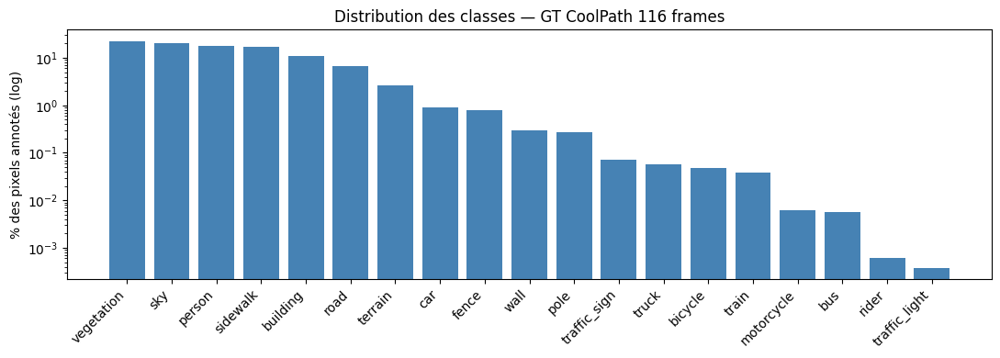

Classes absentes du GT  : aucune
Classes rares (<0.1 %)  : ['traffic_light', 'traffic_sign', 'rider', 'truck', 'bus', 'train', 'motorcycle', 'bicycle']
→ Le mIoU final ne sera calculé que sur les classes présentes dans le val set.


In [3]:
# Distribution des pixels par classe (log) — repère les classes rares avant l'entraînement
frac = pixel_counts / pixel_counts.sum() * 100
order = np.argsort(frac)[::-1]

fig, ax = plt.subplots(figsize=(11, 4))
ax.bar([CITYSCAPES_ORDER[i] for i in order], frac[order], color="steelblue")
ax.set_yscale("log")
ax.set_ylabel("% des pixels annotés (log)")
ax.set_title("Distribution des classes — GT CoolPath 116 frames")
plt.xticks(rotation=45, ha="right"); plt.tight_layout()
fig.savefig(FIG_DIR / "class_distribution.png", dpi=150)
plt.show()

absent = [CITYSCAPES_ORDER[i] for i in range(19) if pixel_counts[i] == 0]
rare   = [CITYSCAPES_ORDER[i] for i in range(19) if 0 < frac[i] < 0.1]
print(f"Classes absentes du GT  : {absent or 'aucune'}")
print(f"Classes rares (<0.1 %)  : {rare or 'aucune'}")
print("→ Le mIoU final ne sera calculé que sur les classes présentes dans le val set.")

## 3. Split train / val stratifié par vidéo

Les frames proviennent de 7 vidéos GoPro. Un split purement aléatoire mettrait des frames quasi identiques (même vidéo, même rue) à la fois en train et en val → **mIoU val artificiellement gonflé**. On stratifie donc : **80/20 à l'intérieur de chaque vidéo**, seed fixe.

In [4]:
random.seed(42)

all_stems = sorted(p.stem for p in IMG_OUT.glob(f"*{IMG_SUFFIX}"))
print(f"{len(all_stems)} frames au total")

# Groupe = identifiant vidéo. Naming nb22 : GS017064[1]_equirect__f001234
# -> split('_')[0] = 'GS017064[1]' : un groupe unique par vidéo
groups = {}
for s in all_stems:
    groups.setdefault(s.split("_")[0], []).append(s)

train_stems, val_stems = [], []
for g, stems in sorted(groups.items()):
    stems = sorted(stems)
    random.shuffle(stems)
    n_val = max(1, round(0.2 * len(stems)))
    val_stems   += stems[:n_val]
    train_stems += stems[n_val:]
    print(f"  {g:<12} : {len(stems):>3} frames → {len(stems)-n_val} train / {n_val} val")

train_stems, val_stems = sorted(train_stems), sorted(val_stems)
(DATASET_DIR / "splits").mkdir(exist_ok=True)
(DATASET_DIR / "splits" / "train.txt").write_text("\n".join(train_stems))
(DATASET_DIR / "splits" / "val.txt").write_text("\n".join(val_stems))

print(f"\nTrain : {len(train_stems)} images")
print(f"Val   : {len(val_stems)} images")

116 frames au total
  GS017064[1]  :   8 frames → 6 train / 2 val
  GS017065[1]  :  20 frames → 16 train / 4 val
  GS017066[1]  :  34 frames → 27 train / 7 val
  GS017067[1]  :  11 frames → 9 train / 2 val
  GS017068[1]  :  12 frames → 10 train / 2 val
  GS017069[1]  :  22 frames → 18 train / 4 val
  GS017070[1]  :   9 frames → 7 train / 2 val

Train : 93 images
Val   : 23 images


## 4. Sanity check visuel du dataset

Vérification que les indices GT correspondent bien aux bonnes classes (palette Cityscapes officielle).

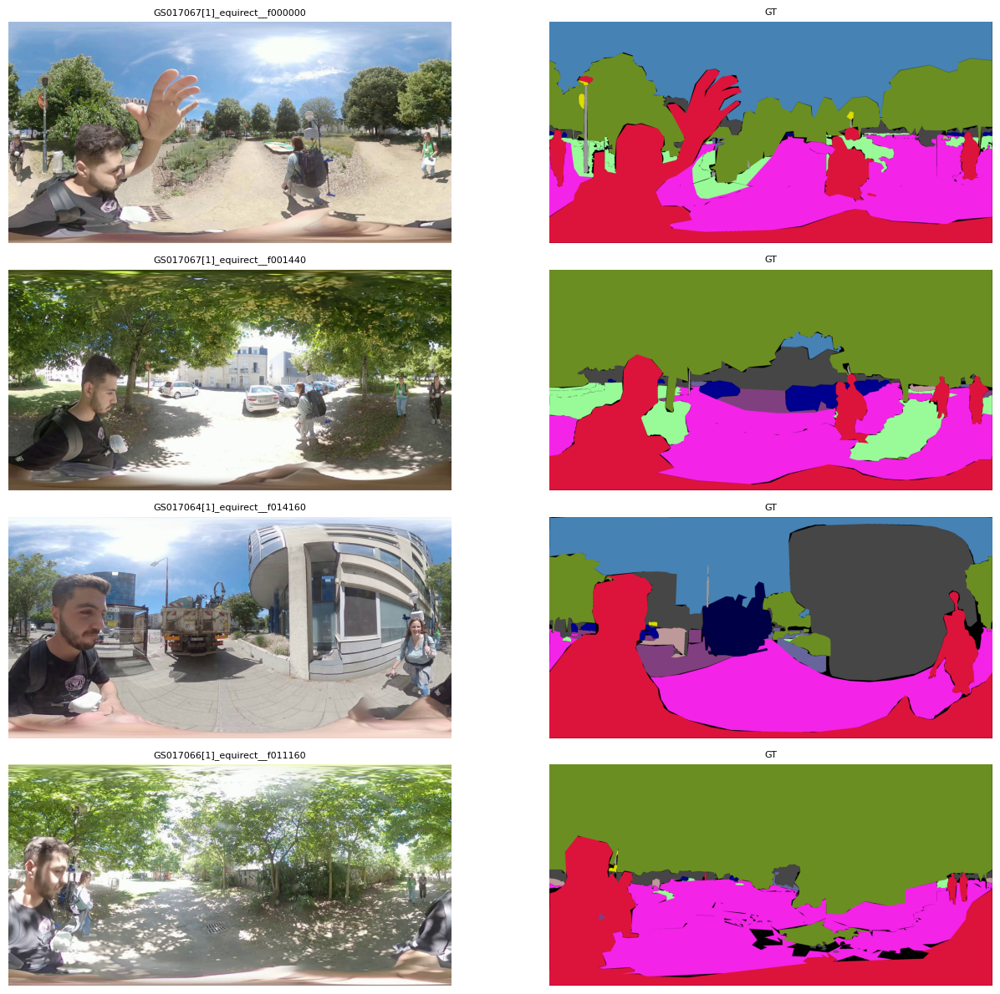

In [5]:
CITYSCAPES_PALETTE = np.array([
    [128,64,128],[244,35,232],[70,70,70],[102,102,156],[190,153,153],
    [153,153,153],[250,170,30],[220,220,0],[107,142,35],[152,251,152],
    [70,130,180],[220,20,60],[255,0,0],[0,0,142],[0,0,70],
    [0,60,100],[0,80,100],[0,0,230],[119,11,32],
], dtype=np.uint8)

def colorize(idx_mask):
    out = np.zeros((*idx_mask.shape, 3), dtype=np.uint8)
    valid = idx_mask != 255
    out[valid] = CITYSCAPES_PALETTE[idx_mask[valid]]
    return out

samples = random.Random(0).sample(train_stems, 4)
fig, axes = plt.subplots(4, 2, figsize=(14, 12))
for row, stem in enumerate(samples):
    img = np.array(Image.open(IMG_OUT / f"{stem}{IMG_SUFFIX}"))
    gt  = np.array(Image.open(LBL_OUT / f"{stem}.png"))
    axes[row, 0].imshow(img);           axes[row, 0].set_title(stem, fontsize=8)
    axes[row, 1].imshow(colorize(gt));  axes[row, 1].set_title("GT", fontsize=8)
    for ax in axes[row]:
        ax.axis("off")
plt.tight_layout()
fig.savefig(FIG_DIR / "sanity_check_gt.png", dpi=120)
plt.show()

## 5. Config d'entraînement

Hyperparamètres retenus pour **RTX PRO 2000 16 Go + AMP** :

| Paramètre | Valeur | Justification |
|---|---|---|
| Crop | 512×1024 | ratio 1:2 = ratio équirectangulaire ; limite VRAM Swin-B |
| Batch | 2 × accumulation 4 = **8 effectif** | stabilité des gradients Mask2Former |
| LR | 5e-5 (backbone ×0.1 hérité de la config de base → 5e-6) | continuation d'un fine-tuning, pas d'entraînement from scratch |
| Scheduler | warmup linéaire 200 it. → PolyLR (power 0.9) | standard MMSeg, robuste |
| Itérations | 5000 (val toutes les 250) | ~92 img train : le `save_best` protège de l'overfitting tardif |
| `frozen_stages=2` | gel patch-embed + 2 stages Swin | features bas niveau déjà bonnes, réduit l'overfitting |
| Augmentations | RandomResize 0.5–1.5 (base 2048×1024 → largeurs 1024–3072, jusqu'à la résolution native), crop `cat_max_ratio=0.75`, flip 0.5, PhotoMetricDistortion | diversité maximale sur petit dataset |
| `cat_max_ratio=0.75` | rejet des crops mono-classe | le bas d'image = porteur (`person`) + `sidewalk` dominants dans le GT |
| Losses | natives Mask2Former (CE + mask BCE + dice) | inchangées — c'est la formulation qui fait la force du modèle |
| TTA (éval finale) | échelles 0.75/1.0/1.25 + flip | gain mIoU sans coût d'entraînement |

`load_from = checkpoint nb18`. Le `work_dir` contient `last_checkpoint` → la reprise (`--resume`) est automatique.

In [6]:
MAX_ITERS    = 5000
VAL_INTERVAL = 250

final_cfg = WORK_DIR / "mask2former_coolpath_final.py"

cfg_content = f"""
_base_ = r'{M2F_BASE_CFG.as_posix()}'

# ---- Dataset CoolPath 360 (116 frames CVAT) ----
dataset_type = 'BaseSegDataset'
data_root = r'{DATASET_DIR.as_posix()}'

metainfo = dict(
    classes=(
        'road','sidewalk','building','wall','fence','pole','traffic_light',
        'traffic_sign','vegetation','terrain','sky','person','rider',
        'car','truck','bus','train','motorcycle','bicycle'
    ),
)

train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='RandomResize', scale=(2048, 1024),
         ratio_range=(0.5, 1.5), keep_ratio=True),
    dict(type='RandomCrop', crop_size=(512, 1024), cat_max_ratio=0.75),
    dict(type='RandomFlip', prob=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='PackSegInputs'),
]

test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='Resize', scale=(2048, 1024), keep_ratio=True),
    dict(type='LoadAnnotations'),
    dict(type='PackSegInputs'),
]

train_dataloader = dict(
    batch_size=2,
    num_workers=4,
    persistent_workers=True,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        data_prefix=dict(img_path='images', seg_map_path='labels'),
        img_suffix='{IMG_SUFFIX}',
        seg_map_suffix='.png',
        ann_file='splits/train.txt',
        metainfo=metainfo,
        pipeline=train_pipeline,
    ),
)

val_dataloader = dict(
    batch_size=1,
    num_workers=2,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        data_prefix=dict(img_path='images', seg_map_path='labels'),
        img_suffix='{IMG_SUFFIX}',
        seg_map_suffix='.png',
        ann_file='splits/val.txt',
        metainfo=metainfo,
        pipeline=test_pipeline,
    ),
)
test_dataloader = val_dataloader

# ---- Point de départ : checkpoint fine-tuné du notebook 18 ----
load_from = r'{START_CKPT.as_posix()}'

# ---- Gel des 2 premiers stages du Swin (anti-overfitting) ----
model = dict(backbone=dict(frozen_stages=2))

# ---- Optimisation : batch effectif 8, LR modéré, clip grad hérité ----
optim_wrapper = dict(
    optimizer=dict(type='AdamW', lr=5e-5, weight_decay=0.05),
    accumulative_counts=4,
)
param_scheduler = [
    dict(type='LinearLR', start_factor=0.1, by_epoch=False, begin=0, end=200),
    dict(type='PolyLR', eta_min=1e-6, power=0.9,
         begin=200, end={MAX_ITERS}, by_epoch=False),
]

train_cfg = dict(type='IterBasedTrainLoop', max_iters={MAX_ITERS}, val_interval={VAL_INTERVAL})
val_cfg = dict(type='ValLoop')
test_cfg = dict(type='TestLoop')

default_hooks = dict(
    checkpoint=dict(type='CheckpointHook', by_epoch=False,
                    interval={VAL_INTERVAL}, max_keep_ckpts=3,
                    save_best='mIoU', save_last=True),
    logger=dict(type='LoggerHook', interval=25),
)

randomness = dict(seed=42)

# ---- TTA pour l'évaluation finale (test.py --tta) ----
tta_model = dict(type='SegTTAModel')
img_ratios = [0.75, 1.0, 1.25]
tta_pipeline = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(
        type='TestTimeAug',
        transforms=[
            [dict(type='Resize', scale_factor=r, keep_ratio=True) for r in img_ratios],
            [dict(type='RandomFlip', prob=0., direction='horizontal'),
             dict(type='RandomFlip', prob=1., direction='horizontal')],
            [dict(type='LoadAnnotations')],
            [dict(type='PackSegInputs')],
        ]),
]

work_dir = r'{WORK_DIR.as_posix()}'
"""

final_cfg.write_text(cfg_content.strip(), encoding="utf-8")
print(f"Config écrite : {final_cfg}")
print(f"load_from     : {START_CKPT.name}")
print(f"max_iters     : {MAX_ITERS} | batch effectif : 8 | crop : 512x1024 | AMP : oui")

Config écrite : C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\mask2former_coolpath_final.py
load_from     : best_mIoU_iter_750.pth
max_iters     : 5000 | batch effectif : 8 | crop : 512x1024 | AMP : oui


## 6. Entraînement — avec reprise automatique

- **Premier lancement** : entraînement complet depuis `load_from` (checkpoint nb18).
- **Interruption** (Kernel Interrupt, coupure…) : relancer simplement cette cellule → `--resume` reprend depuis `last_checkpoint` (itération, optimizer, scheduler, seed restaurés).
- Le meilleur modèle (mIoU val) est sauvegardé en continu : `best_mIoU_iter_*.pth`.

⏱️ Ordre de grandeur : ~3–5 h pour 5000 itérations sur RTX PRO 2000 (AMP).

In [7]:
import subprocess

train_script = Path(mmseg.__file__).parent / ".mim" / "tools" / "train.py"
if not train_script.exists():
    cands = list(Path(mmseg.__file__).parent.rglob("tools/train.py"))
    train_script = cands[0] if cands else None
assert train_script and train_script.exists(), "train.py de mmseg introuvable"

RESUME = True   # False pour forcer un redémarrage depuis load_from (nb18)

cmd = [sys.executable, str(train_script), str(final_cfg),
       "--work-dir", str(WORK_DIR)]
if RESUME and (WORK_DIR / "last_checkpoint").exists():
    cmd.append("--resume")
    print(f"🔄 Reprise depuis : {(WORK_DIR / 'last_checkpoint').read_text().strip()}\n")
else:
    print(f"🚀 Nouvel entraînement depuis : {START_CKPT.name}\n")
print(" ".join(cmd), "\n" + "=" * 80)

t0 = time.time()
proc = subprocess.Popen(cmd, stdout=subprocess.PIPE, stderr=subprocess.STDOUT,
                        text=True, encoding="utf-8", errors="replace", bufsize=1)
for line in proc.stdout:
    # on n'affiche que les lignes utiles pour ne pas saturer le notebook
    if any(k in line for k in ("Iter(", "mIoU", "aAcc", "best", "Saving", "Load", "resume", "Traceback", "Error")):
        print(line.rstrip())
proc.wait()
print("=" * 80)
print(f"Code retour : {proc.returncode} | durée : {(time.time()-t0)/3600:.2f} h")
assert proc.returncode == 0, "L'entraînement a échoué — voir le log complet dans WORK_DIR"

🔄 Reprise depuis : C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\iter_1000.pth

C:\Users\yboujmil\AppData\Local\miniconda3\envs\coolpath\python.exe C:\Users\yboujmil\AppData\Local\miniconda3\envs\coolpath\lib\site-packages\mmseg\.mim\tools\train.py C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\mask2former_coolpath_final.py --work-dir C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f --resume 
        save_best='mIoU',
load_from = 'C:/Users/yboujmil/Downloads/coolpath_local/data/outputs/finetune_mask2former/best_mIoU_iter_750.pth'
resume = True
            dict(type='LoadImageFromFile'),
            dict(type='LoadAnnotations'),
        'mIoU',
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
            dict(type='LoadImageFromFile'),
            dict(type='LoadAnnotations'),
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(backend_args=None, type='LoadI

## 7. Courbes d'entraînement

Parsing des `scalars.json` de **tous les runs** du `work_dir` (un run par lancement/reprise) → courbes continues loss et mIoU val.

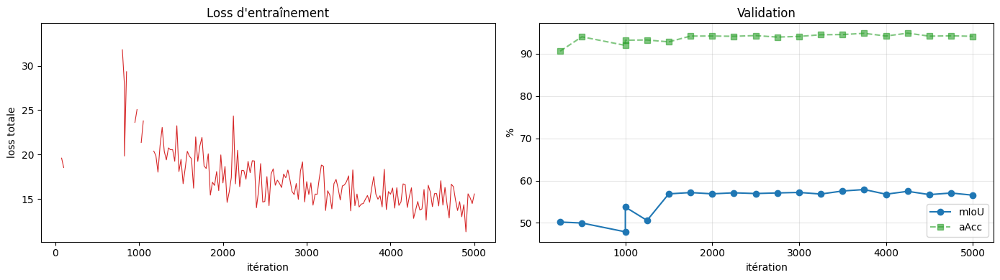

Meilleur mIoU val : 57.88 % à l'itération 3750


In [8]:
scalar_files = sorted(WORK_DIR.glob("*/vis_data/scalars.json"))
assert scalar_files, "Aucun scalars.json trouvé — l'entraînement a-t-il tourné ?"

train_iters, train_loss, val_iters, val_miou, val_aacc = [], [], [], [], []
for sf in scalar_files:
    for line in sf.read_text(encoding="utf-8").splitlines():
        try:
            rec = json.loads(line)
        except json.JSONDecodeError:
            continue
        if "loss" in rec and "iter" in rec:
            train_iters.append(rec["iter"]); train_loss.append(rec["loss"])
        if "mIoU" in rec:
            it = rec.get("iter", rec.get("step", 0))
            val_iters.append(it); val_miou.append(rec["mIoU"]); val_aacc.append(rec.get("aAcc", np.nan))

# tri (plusieurs runs concaténés)
o = np.argsort(train_iters)
train_iters, train_loss = np.array(train_iters)[o], np.array(train_loss)[o]
o = np.argsort(val_iters)
val_iters, val_miou, val_aacc = np.array(val_iters)[o], np.array(val_miou)[o], np.array(val_aacc)[o]

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(train_iters, train_loss, lw=0.8, color="tab:red")
axes[0].set_xlabel("itération"); axes[0].set_ylabel("loss totale"); axes[0].set_title("Loss d'entraînement")
axes[1].plot(val_iters, val_miou, "o-", color="tab:blue", label="mIoU")
axes[1].plot(val_iters, val_aacc, "s--", color="tab:green", alpha=0.6, label="aAcc")
axes[1].set_xlabel("itération"); axes[1].set_ylabel("%"); axes[1].set_title("Validation")
axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout(); fig.savefig(FIG_DIR / "training_curves.png", dpi=150); plt.show()

best_i = int(np.argmax(val_miou))
print(f"Meilleur mIoU val : {val_miou[best_i]:.2f} % à l'itération {val_iters[best_i]}")

## 8. Évaluation finale sur le val set

Matrice de confusion 19×19 accumulée **à pleine résolution** (les prédictions sont re-projetées par MMSeg à la taille d'origine) → IoU et Acc par classe, aAcc, mAcc, mIoU. Les classes absentes du val set sont exclues de la moyenne.

In [9]:
from mmseg.apis import init_model, inference_model
import pandas as pd

best_ckpts = sorted(WORK_DIR.glob("best_mIoU_iter_*.pth"),
                    key=lambda p: int(p.stem.split("_")[-1]))
assert best_ckpts, "Aucun best_mIoU_iter_*.pth dans WORK_DIR"
BEST_CKPT = best_ckpts[-1]
print(f"Meilleur checkpoint : {BEST_CKPT.name}\n")

def eval_checkpoint(ckpt_path, tag):
    '''Confusion 19x19 sur le val set + métriques dérivées.'''
    model = init_model(str(final_cfg), str(ckpt_path), device="cuda:0")
    conf = np.zeros((19, 19), dtype=np.int64)
    t0 = time.time()
    for stem in val_stems:
        res  = inference_model(model, str(IMG_OUT / f"{stem}{IMG_SUFFIX}"))
        pred = res.pred_sem_seg.data.squeeze().cpu().numpy().astype(np.int64)
        gt   = np.array(Image.open(LBL_OUT / f"{stem}.png")).astype(np.int64)
        m = gt != 255
        conf += np.bincount(gt[m] * 19 + pred[m], minlength=361).reshape(19, 19)
    del model; torch.cuda.empty_cache()

    inter = np.diag(conf).astype(np.float64)
    union = conf.sum(1) + conf.sum(0) - np.diag(conf)
    gt_px = conf.sum(1)
    present = gt_px > 0
    iou = np.where(union > 0, inter / np.maximum(union, 1), np.nan) * 100
    acc = np.where(present, inter / np.maximum(gt_px, 1), np.nan) * 100
    metrics = dict(
        mIoU=np.nanmean(iou[present]), mAcc=np.nanmean(acc[present]),
        aAcc=inter.sum() / conf.sum() * 100,
    )
    print(f"[{tag}] {len(val_stems)} images en {time.time()-t0:.0f}s — "
          f"mIoU {metrics['mIoU']:.2f} | mAcc {metrics['mAcc']:.2f} | aAcc {metrics['aAcc']:.2f}")
    return conf, iou, acc, present, metrics

conf23, iou23, acc23, present, metrics23 = eval_checkpoint(BEST_CKPT, "nb23")

df = pd.DataFrame({
    "classe": CITYSCAPES_ORDER,
    "IoU (%)": np.round(iou23, 2),
    "Acc (%)": np.round(acc23, 2),
    "pixels GT": conf23.sum(1),
}).sort_values("IoU (%)", ascending=False)
df.to_csv(WORK_DIR / "per_class_metrics_nb23.csv", index=False)
display(df)

Meilleur checkpoint : best_mIoU_iter_3750.pth

Loads checkpoint by local backend from path: C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\best_mIoU_iter_3750.pth


C:\Users\yboujmil\AppData\Local\miniconda3\envs\coolpath\lib\site-packages\torch\functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\TensorShape.cpp:4383.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])


,classe,IoU (%),Acc (%),pixels GT
10,sky,97.21,98.88,18700527
8,vegetation,95.21,96.59,27173940
11,person,94.30,96.67,18916351
2,building,92.02,97.03,10643665
13,car,90.66,95.92,970562
1,sidewalk,85.77,92.51,20889779
9,terrain,69.63,88.61,2595862
0,road,68.50,81.06,4828387
4,fence,67.57,78.74,1241824
18,bicycle,67.24,74.03,118358


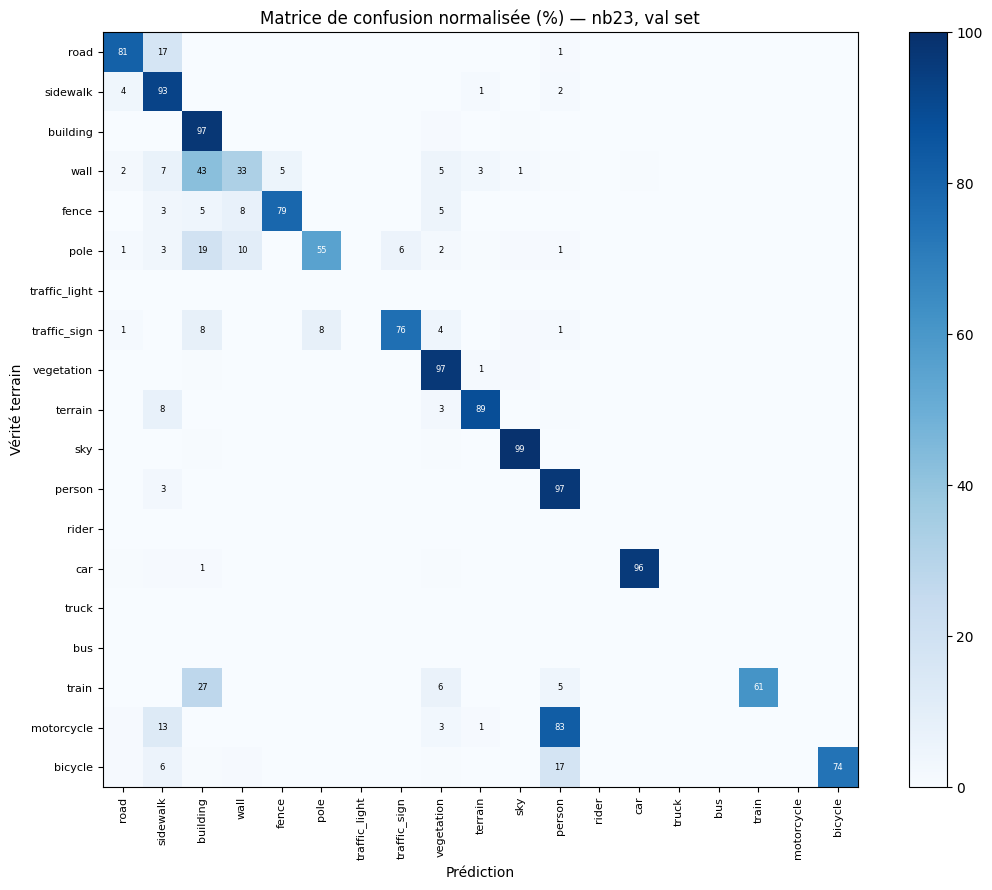

In [10]:
# Matrice de confusion normalisée par ligne (rappel par classe GT)
row_sum = conf23.sum(1, keepdims=True)
conf_norm = np.divide(conf23, np.maximum(row_sum, 1)) * 100

fig, ax = plt.subplots(figsize=(11, 9))
im = ax.imshow(conf_norm, cmap="Blues", vmin=0, vmax=100)
ax.set_xticks(range(19)); ax.set_xticklabels(CITYSCAPES_ORDER, rotation=90, fontsize=8)
ax.set_yticks(range(19)); ax.set_yticklabels(CITYSCAPES_ORDER, fontsize=8)
ax.set_xlabel("Prédiction"); ax.set_ylabel("Vérité terrain")
ax.set_title("Matrice de confusion normalisée (%) — nb23, val set")
for i in range(19):
    for j in range(19):
        if conf_norm[i, j] >= 1 and row_sum[i] > 0:
            ax.text(j, i, f"{conf_norm[i, j]:.0f}", ha="center", va="center",
                    fontsize=6, color="white" if conf_norm[i, j] > 50 else "black")
plt.colorbar(im, fraction=0.046)
plt.tight_layout(); fig.savefig(FIG_DIR / "confusion_matrix_nb23.png", dpi=150); plt.show()

### Évaluation officielle avec TTA (multi-échelle + flip)

`test.py --tta` applique les échelles 0.75/1.0/1.25 + flip horizontal définis dans la config → métriques MMSeg officielles, à reporter dans le rapport.

In [11]:
test_script = train_script.parent / "test.py"
assert test_script.exists(), "test.py de mmseg introuvable"

cmd = [sys.executable, str(test_script), str(final_cfg), str(BEST_CKPT),
       "--work-dir", str(WORK_DIR / "tta_eval"), "--tta"]
print(" ".join(cmd), "\n" + "=" * 80)
proc = subprocess.Popen(cmd, stdout=subprocess.PIPE, stderr=subprocess.STDOUT,
                        text=True, encoding="utf-8", errors="replace", bufsize=1)
tta_lines = []
for line in proc.stdout:
    if any(k in line for k in ("IoU", "Acc", "+--", "|", "Traceback", "Error")):
        print(line.rstrip()); tta_lines.append(line)
proc.wait()
print(f"\nCode retour : {proc.returncode}")
print(f"\n→ Comparer le mIoU TTA ci-dessus au mIoU sans TTA ({metrics23['mIoU']:.2f} %) : "
      "le gain TTA est typiquement de +0.5 à +1.5 pt.")

C:\Users\yboujmil\AppData\Local\miniconda3\envs\coolpath\python.exe C:\Users\yboujmil\AppData\Local\miniconda3\envs\coolpath\lib\site-packages\mmseg\.mim\tools\test.py C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\mask2former_coolpath_final.py C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\best_mIoU_iter_3750.pth --work-dir C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\tta_eval --tta 
    Python: 3.10.20 | packaged by Anaconda, Inc. | (main, Mar 11 2026, 17:42:35) [MSC v.1942 64 bit (AMD64)]
        save_best='mIoU',
load_from = 'C:\\Users\\yboujmil\\Downloads\\coolpath_local\\data\\outputs\\final_training_m2f\\best_mIoU_iter_3750.pth'
        'mIoU',
    ], type='IoUMetric')
        'mIoU',
    ], type='IoUMetric')
07/03 12:08:13 - mmengine - WARNING - The prefix is not set in metric class IoUMetric.
Loads checkpoint by local backend from path: C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\

## 9. Comparaison nb18 → nb23 (même val set, même protocole)

Le checkpoint du notebook 18 (25 frames perspective) est évalué sur le **même val set 360°** que le modèle final → mesure directe du gain apporté par les 116 nouvelles annotations.

Loads checkpoint by local backend from path: C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\finetune_mask2former\best_mIoU_iter_750.pth
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:

,classe,IoU nb18 (%),IoU nb23 (%),Δ IoU
1,sidewalk,23.14,85.77,62.62
0,road,23.09,68.50,45.42
16,train,30.48,49.70,19.21
11,person,81.92,94.30,12.38
5,pole,34.32,46.66,12.34
8,vegetation,88.04,95.21,7.17
4,fence,62.00,67.57,5.58
9,terrain,64.04,69.63,5.58
2,building,86.60,92.02,5.42
13,car,87.90,90.66,2.76



mIoU : 54.15 % (nb18)  →  65.60 % (nb23)   Δ = +11.44 pt
aAcc : 79.74 %  →  94.77 %   Δ = +15.03 pt


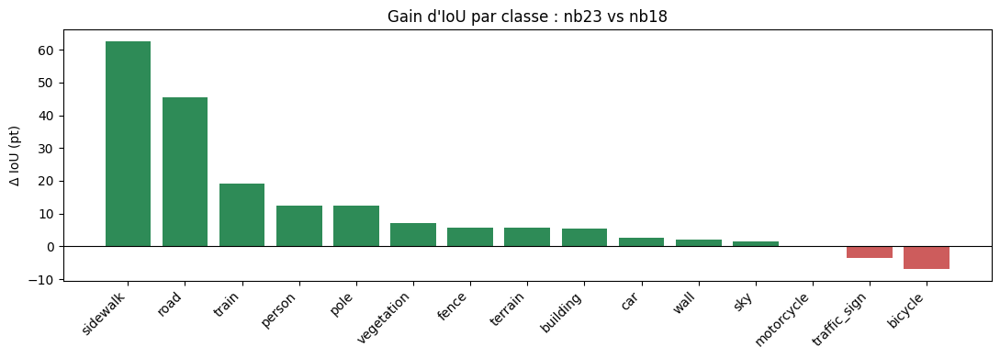

In [12]:
if START_CKPT.parent != CHECKPOINTS_DIR:   # un vrai checkpoint nb18 existe
    conf18, iou18, acc18, _, metrics18 = eval_checkpoint(START_CKPT, "nb18")

    comp = pd.DataFrame({
        "classe": CITYSCAPES_ORDER,
        "IoU nb18 (%)": np.round(iou18, 2),
        "IoU nb23 (%)": np.round(iou23, 2),
        "Δ IoU": np.round(iou23 - iou18, 2),
    })
    comp = comp[present].sort_values("Δ IoU", ascending=False)
    display(comp)

    print(f"\nmIoU : {metrics18['mIoU']:.2f} % (nb18)  →  {metrics23['mIoU']:.2f} % (nb23)"
          f"   Δ = {metrics23['mIoU'] - metrics18['mIoU']:+.2f} pt")
    print(f"aAcc : {metrics18['aAcc']:.2f} %  →  {metrics23['aAcc']:.2f} %"
          f"   Δ = {metrics23['aAcc'] - metrics18['aAcc']:+.2f} pt")

    fig, ax = plt.subplots(figsize=(11, 4))
    ax.bar(comp["classe"], comp["Δ IoU"],
           color=np.where(comp["Δ IoU"] >= 0, "seagreen", "indianred"))
    ax.axhline(0, color="k", lw=0.8)
    ax.set_ylabel("Δ IoU (pt)"); ax.set_title("Gain d'IoU par classe : nb23 vs nb18")
    plt.xticks(rotation=45, ha="right"); plt.tight_layout()
    fig.savefig(FIG_DIR / "delta_iou_nb18_nb23.png", dpi=150); plt.show()
else:
    print("Pas de checkpoint nb18 disponible → comparaison ignorée.")

## 10. Visualisation des résultats sur le val set

Pour chaque image : original | GT | prédiction | **carte d'erreurs** (rouge = pixel mal classé, gris = ignore).

Loads checkpoint by local backend from path: C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\best_mIoU_iter_3750.pth
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0

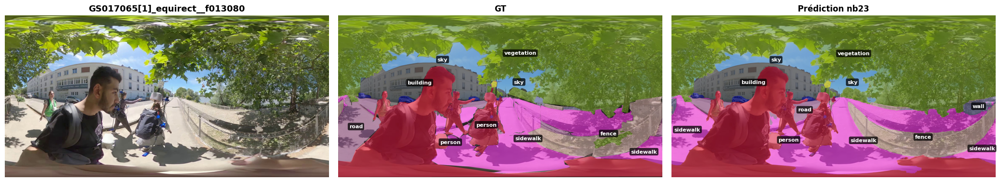

DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])


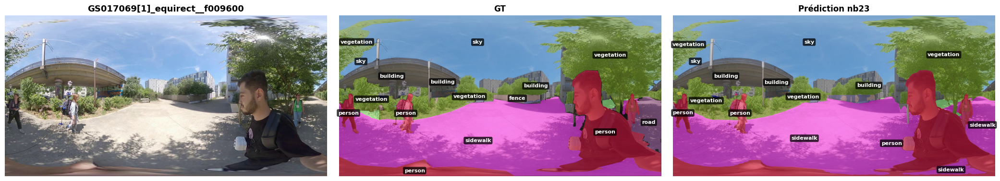

DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])


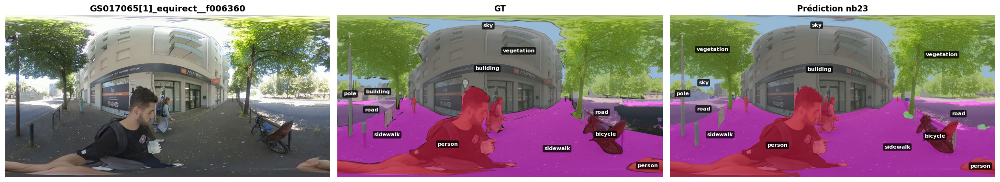

DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])


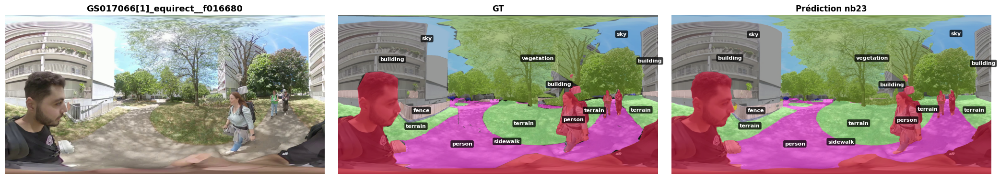

DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])


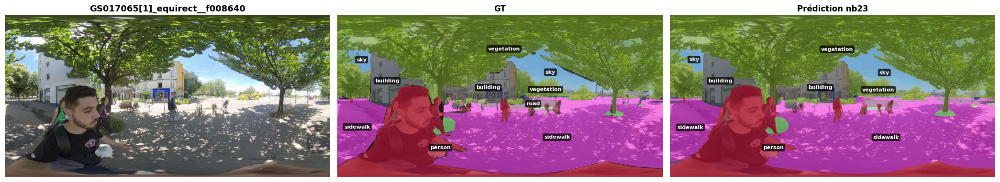

DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])


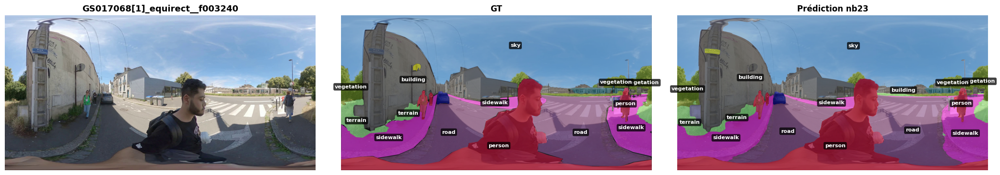

DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])


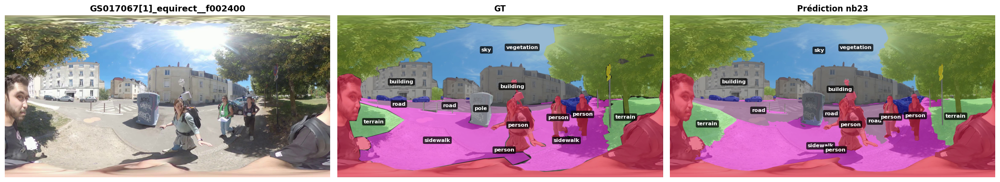

DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])
DEBUG num_value= 43008 sum= tensor(43008, device='cuda:0') value.shape= torch.Size([1, 43008, 256])


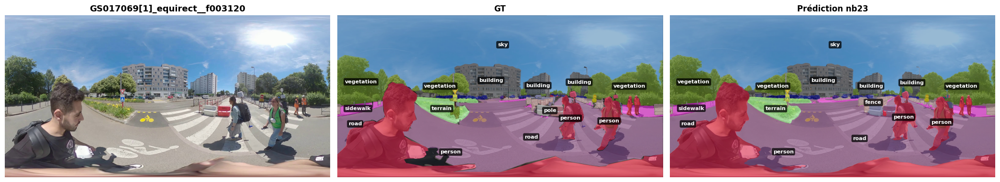


Figures sauvegardées dans : C:\Users\yboujmil\Downloads\coolpath_local\data\outputs\final_training_m2f\figures


In [17]:
from skimage.measure import label as cc_label, regionprops

NUM_CLASSES = 19

def draw_segmented_with_labels(ax, image_arr, mask, alpha=0.55, min_area_frac=0.005):
    """Overlay segmentation + étiquettes de classe au centre des segments."""
    color = colorize(mask)
    blended = ((1 - alpha) * image_arr + alpha * color).astype(np.uint8)
    ax.imshow(blended)
    h, w = mask.shape
    min_area = int(min_area_frac * h * w)
    for class_id in np.unique(mask):
        if class_id >= NUM_CLASSES:
            continue
        binary = (mask == class_id).astype(np.uint8)
        labeled = cc_label(binary)
        for region in regionprops(labeled):
            if region.area >= min_area:
                cy, cx = region.centroid
                ax.text(cx, cy, CITYSCAPES_ORDER[class_id],
                        ha="center", va="center",
                        fontsize=8, color="white", fontweight="bold",
                        bbox=dict(boxstyle="round,pad=0.25",
                                  facecolor="black", alpha=0.75,
                                  edgecolor="none"))
    ax.axis("off")

model = init_model(str(final_cfg), str(BEST_CKPT), device="cuda:0")

N_VIS = min(8, len(val_stems))
vis_stems = random.Random(1).sample(val_stems, N_VIS)

for stem in vis_stems:
    img  = np.array(Image.open(IMG_OUT / f"{stem}{IMG_SUFFIX}"))
    gt   = np.array(Image.open(LBL_OUT / f"{stem}.png"))
    res  = inference_model(model, str(IMG_OUT / f"{stem}{IMG_SUFFIX}"))
    pred = res.pred_sem_seg.data.squeeze().cpu().numpy().astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(21, 6))

    axes[0].imshow(img)
    axes[0].set_title(stem, fontweight="bold", fontsize=13)
    axes[0].axis("off")

    draw_segmented_with_labels(axes[1], img, gt)
    axes[1].set_title("GT", fontweight="bold", fontsize=12)

    draw_segmented_with_labels(axes[2], img, pred)
    axes[2].set_title("Prédiction nb23", fontweight="bold", fontsize=12)

    plt.tight_layout()
    fig.savefig(FIG_DIR / f"result_{stem}.png", dpi=110, bbox_inches="tight")
    plt.show()

del model; torch.cuda.empty_cache()
print(f"\nFigures sauvegardées dans : {FIG_DIR}")

## 11. Analyse automatique

In [15]:
print("=" * 80)
print("SYNTHÈSE — ENTRAÎNEMENT FINAL MASK2FORMER (nb23)")
print("=" * 80)
print(f"Dataset      : {len(train_stems)} train / {len(val_stems)} val "
      f"({len(groups)} vidéos, split stratifié)")
print(f"Checkpoint   : {BEST_CKPT.name}")
print(f"mIoU / mAcc / aAcc (val, sans TTA) : "
      f"{metrics23['mIoU']:.2f} / {metrics23['mAcc']:.2f} / {metrics23['aAcc']:.2f} %")

idx_present = np.where(present)[0]
order_iou = idx_present[np.argsort(iou23[idx_present])]
print("\nClasses les plus fortes :")
for i in order_iou[::-1][:5]:
    print(f"  {CITYSCAPES_ORDER[i]:<15} IoU {iou23[i]:6.2f} %")
print("Classes les plus faibles :")
for i in order_iou[:5]:
    print(f"  {CITYSCAPES_ORDER[i]:<15} IoU {iou23[i]:6.2f} %  ({conf23.sum(1)[i]:,} px GT)")

# Confusions dominantes hors diagonale (en % de la classe GT)
off = conf_norm.copy(); np.fill_diagonal(off, 0)
flat = np.argsort(off, axis=None)[::-1]
print("\nConfusions dominantes (GT → prédit) :")
shown = 0
for f in flat:
    i, j = divmod(f, 19)
    if conf23.sum(1)[i] < 1000:          # ignorer les classes quasi absentes
        continue
    print(f"  {CITYSCAPES_ORDER[i]:<15} → {CITYSCAPES_ORDER[j]:<15} {off[i, j]:5.1f} %")
    shown += 1
    if shown == 5:
        break

print('''
INTERPRÉTATION / PISTES (à adapter selon les chiffres ci-dessus) :
- La classe 'person' est dominée par le PORTEUR (nadir, fortement déformé) : son IoU
  mesure surtout la segmentation du porteur. C'est voulu — ce masque servira à exclure
  le porteur du calcul SVF/GVI en Phase 5.
- GT 100 % estival/ensoleillé : le modèle reste biaisé été (cf. problème arbres nus
  en hiver) → à mentionner dans le rapport.
- Classes faibles = généralement les classes rares du GT (voir section 2) : l'IoU y est
  bruité car calculé sur peu de pixels → à mentionner dans le rapport.
- Confusions attendues en 360° hiver : vegetation↔sky (arbres nus), road↔sidewalk
  (bordures déformées par la projection), terrain↔vegetation.
- Si le mIoU val plafonne tôt sur les courbes (§7) : augmenter les annotations plutôt
  que les itérations. Si la loss train continue de baisser avec mIoU val stable/déclinant :
  overfitting → le save_best a déjà retenu le bon checkpoint.
- Prochaine étape pipeline : brancher ce checkpoint dans la Phase 4 (inférence TTA +
  correction Depth Anything V2) puis Phase 5 (SVF équisolide, GVI, perméabilité).
''')

SYNTHÈSE — ENTRAÎNEMENT FINAL MASK2FORMER (nb23)
Dataset      : 93 train / 23 val (7 vidéos, split stratifié)
Checkpoint   : best_mIoU_iter_3750.pth
mIoU / mAcc / aAcc (val, sans TTA) : 65.60 / 75.01 / 94.77 %

Classes les plus fortes :
  sky             IoU  97.21 %
  vegetation      IoU  95.21 %
  person          IoU  94.30 %
  building        IoU  92.02 %
  car             IoU  90.66 %
Classes les plus faibles :
  motorcycle      IoU   0.00 %  (6,284 px GT)
  wall            IoU  21.19 %  (332,645 px GT)
  traffic_sign    IoU  38.28 %  (57,148 px GT)
  pole            IoU  46.66 %  (291,556 px GT)
  train           IoU  49.70 %  (36,456 px GT)

Confusions dominantes (GT → prédit) :
  motorcycle      → person           82.6 %
  wall            → building         42.5 %
  train           → building         27.4 %
  pole            → building         19.0 %
  bicycle         → person           17.2 %

INTERPRÉTATION / PISTES (à adapter selon les chiffres ci-dessus) :
- La classe 'perso